**CURSO**: Análisis Geoespacial, Departamento de Geociencias y Medio Ambiente, Universidad Nacional de Colombia - sede Medellín <br/>
**Profesor**: Edier Aristizábal (evaristizabalg@unal.edu.co) <br />
**Credits**: The content of this notebook is taken from several sources such as [Abhishek Sharma](https://www.analyticsvidhya.com/blog/2020/06/guide-geospatial-analysis-folium-python/), but specially from the courses and book open and freely published by [Dani Arribas-Bel](http://darribas.org/) -  University of Liverpool & - Sergio Rey - [Center for Geospatial Sciences, University of California, Riverside](http://spatial.ucr.edu/peopleRey.html). Every effort has been made to trace copyright holders of the materials used in this book. The author apologies for any unintentional omissions and would be pleased to add an acknowledgment in future editions. 

# Interactive maps: Adding base layers from web sources

Everything we have seen so far relates to static maps. These are useful for publication, to include in reports or to print. However, modern web technologies afford much more flexibility to explore spatial data interactively.

In [1]:
!pip install geopandas

In [2]:
import pandas as pd
import geopandas as gpd

import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

### Folium

[Folium](https://python-visualization.github.io/folium/) is a Python library used for visualizing geospatial data. It is easy to use and yet a powerful library. Folium is a Python wrapper for Leaflet. js which is a leading open-source JavaScript library for plotting interactive maps.

In [3]:
import folium

ModuleNotFoundError: No module named 'folium'

In [6]:
folium.Map(location = [4.664827, -76.516], zoom_start = 6)

The default tiles are set to OpenStreetMap, but Stamen Terrain, Stamen Toner, Mapbox Bright, and Mapbox Control Room

In [7]:
folium.Map(width=550,height=350,location= [4.665, -76.516], zoom_start = 6, tiles = 'Stamen Terrain')

LayerControl() provides an icon on the top-right corner of the map for switching between the different layers.

In [9]:
my_map=folium.Map(location= [4.665, -76.516], zoom_start = 6)
folium.TileLayer('CartoDB Positron').add_to(my_map)

# other mapping code (e.g. lines, markers etc.)
folium.LayerControl().add_to(my_map)

my_map


In [ ]:
folium_map = folium.Map(location=[-8.907970, 33.433200],
                        zoom_start=7,
                        tiles='mapbox://styles/edieraristizabal/clfa1ygli001f01l1sta0hdjc',
                        attr='Mapbox',
                        API_key='pk.eyJ1IjoiZWRpZXJhcmlzdGl6YWJhbCIsImEiOiJja2V3MG5hbTUzNjZlMnRxbTRhM282M29kIn0.iUtvK3OKv5IXnzn7lfRRYQ'     
)
folium_map

### Plotting Markers on the Map
Markers are the items used for marking a location on a map. For example, when you use Google Maps for navigation, your location is marked by a marker and your destination is marked by another marker. Markers are among the most important and helpful things on a map.

In [13]:
m = folium.Map(location=[6.2443382, -75.573553], zoom_start=13, width='60%',height='60%')
folium.Marker([6.2443382, -75.573553], popup="<strong>Medellín</strong>", tooltip="Click me").add_to(m)
folium.Marker([6.2444000, -75.591000], icon=folium.Icon(icon="cloud", color='green')).add_to(m)
folium.Circle(radius=500, location=[6.2444000, -75.598000], color="#45ffff", fill=True, fill_color="#3186cc",weight=3).add_to(m)
m

### Plotting Paths using Folium
we’ll plot the path of 3 vehicles on the map. We have three arrays for three vehicles containing latitudes and longitudes of their paths:

In [ ]:
coords_1=[[28.65685,77.21899],[28.65699,77.21898],[28.65699,77.21898],
[28.65702,77.21875],[28.65702,77.21875],[28.6547,77.21902],[28.65308,77.21921],
[28.65286,77.21926],[28.65255,77.21938],[28.65227,77.21954],[28.65152,77.22005],
[28.64655,77.22346],[28.64643,77.22354],[28.64635,77.22357],[28.64623,77.2236],
[28.64616,77.22363],[28.64612,77.22364],[28.64557,77.22364],[28.64525,77.22365],
[28.64525,77.22365],[28.64517,77.22366],[28.64515,77.22367],[28.64512,77.22367],
[28.64504,77.22369],[28.64493,77.22371],[28.64483,77.22373],[28.64462,77.22377],
[28.6445,77.22381],[28.64444,77.22383],[28.64439,77.22387],[28.64434,77.2239],
[28.64429,77.22395],[28.64421,77.22403],[28.64417,77.22412],[28.64407,77.22429],
[28.64391,77.22465],[28.64353,77.22539],[28.64282,77.22678],[28.64282,77.22678],
[28.64285,77.2268],[28.64287,77.22683],[28.64289,77.22686],[28.64291,77.2269],
[28.64292,77.22694],[28.64292,77.22697],[28.64292,77.22701],[28.64292,77.22705],
[28.64292,77.22705],[28.64291,77.22711],[28.64288,77.22716],[28.64285,77.2272],
[28.64281,77.22724],[28.64276,77.22726],[28.64271,77.22728],[28.64266,77.22728],
[28.64261,77.22727],[28.64261,77.22727],[28.64257,77.22725],[28.64254,77.22723],
[28.64251,77.2272],[28.64249,77.22717],[28.64247,77.22713],[28.64245,77.22709],
[28.64244,77.22704],[28.64244,77.22699],[28.64245,77.22693],[28.64246,77.22689],
[28.64214,77.22665],[28.64169,77.22632],[28.64163,77.22627],[28.64095,77.22582],
[28.64009,77.22516],[28.63913,77.22445],[28.63799,77.22352],[28.63794,77.22349],
[28.63761,77.22327],[28.6375,77.2232],[28.63737,77.22311],[28.63727,77.22304],
[28.63706,77.22288],[28.63631,77.22233],[28.63528,77.2216],[28.63521,77.22154],
[28.63521,77.22154],[28.63518,77.22158],[28.63499,77.2218],[28.63471,77.22212],
[28.63442,77.22238],[28.63411,77.2226],[28.6339,77.22272],[28.63368,77.22282],
[28.63345,77.2229],[28.63313,77.22297],[28.63281,77.22299],[28.63249,77.22298],
[28.63217,77.22293],[28.63186,77.22283],[28.63141,77.22256],[28.63125,77.2224],
[28.63101,77.22227],[28.63082,77.22207],[28.63062,77.22185],[28.63046,77.22162],
[28.63029,77.22141],[28.63029,77.22141],[28.63026,77.22138],[28.63022,77.22136],
[28.63018,77.22135],[28.63014,77.22134],[28.6301,77.22134],[28.63006,77.22135],
[28.63004,77.22135],[28.63004,77.22135]]

coords_2=[[28.63382,77.22045],[28.63458,77.221],[28.63514,77.22142],
[28.63517,77.22146],[28.63519,77.22151],[28.63518,77.22158],[28.63518,77.22158],
[28.63499,77.2218],[28.63471,77.22212],[28.63442,77.22238],[28.63411,77.2226],
[28.6339,77.22272],[28.63368,77.22282],[28.63345,77.2229],[28.63313,77.22297],
[28.63281,77.22299],[28.63249,77.22298],[28.63217,77.22293],[28.63186,77.22283],
[28.63141,77.22256],[28.63141,77.22256],[28.63129,77.22258],[28.63121,77.22259],
[28.63113,77.22266],[28.63072,77.22335],[28.63063,77.22353],[28.63059,77.22359],
[28.63046,77.22381],[28.63043,77.22388],[28.62914,77.22615],[28.62914,77.22615],
[28.62922,77.22648],[28.62923,77.22651],[28.62924,77.22653],[28.62925,77.22655],
[28.62926,77.22657],[28.62935,77.22665],[28.62937,77.22667],[28.62938,77.22669],
[28.62939,77.22672],[28.62943,77.22682],[28.62943,77.22682],[28.62972,77.22701],
[28.63027,77.22744],[28.63436,77.23048],[28.63456,77.2306],[28.63482,77.23072],
[28.63511,77.23084],[28.63545,77.23091],[28.63581,77.23095],[28.63656,77.23101],
[28.63673,77.23102],[28.63824,77.23116],[28.63985,77.23134],[28.64039,77.23144],
[28.64039,77.23144],[28.64049,77.23147],[28.64038,77.23156],[28.64022,77.23153],
[28.64022,77.23153]]

coords_3=[[28.63216,77.21864],[28.63225,77.21858],[28.63237,77.21851],
[28.6325,77.21846],[28.63262,77.21843],[28.63279,77.21841],[28.63295,77.21843],
[28.63311,77.21846],[28.63326,77.21853],[28.63341,77.21862],[28.63341,77.21862],
[28.63394,77.21768],[28.6342,77.21722],[28.63425,77.21713],[28.6343,77.21704],
[28.6343,77.21704],[28.63432,77.21686],[28.63495,77.21581],[28.6357,77.21452],
[28.63745,77.21151],[28.63951,77.20794],[28.63956,77.20787],[28.63971,77.20763],
[28.64055,77.2061],[28.64096,77.20533],[28.64106,77.20519],[28.64121,77.20486],
[28.64132,77.20468],[28.64179,77.20418],[28.64222,77.20381],[28.64254,77.20346],
[28.64267,77.20333],[28.64277,77.2032],[28.64277,77.2032],[28.64281,77.20314],
[28.64285,77.20309],[28.64291,77.20306],[28.64297,77.20304],[28.64303,77.20303],
[28.64309,77.20304],[28.64315,77.20306],[28.6432,77.2031],[28.64324,77.20314],
[28.64327,77.2032],[28.64327,77.2032],[28.64341,77.20336],[28.64375,77.20351],
[28.64406,77.20367],[28.64495,77.20426],[28.6459,77.20495],[28.64612,77.2051],
[28.64612,77.2051],[28.64629,77.2051],[28.64639,77.20508],[28.64648,77.20506],
[28.64657,77.20497],[28.64659,77.20495],[28.64659,77.20495]]

In [ ]:
m=folium.Map(location=[28.644800, 77.216721],tiles='cartodbpositron',zoom_start=14)
# Creating feature groups
f1=folium.FeatureGroup("Vehicle 1")
f2=folium.FeatureGroup("Vehicle 2")
f3=folium.FeatureGroup("Vehicle 3")

# Adding lines to the different feature groups
line_1=folium.vector_layers.PolyLine(coords_1,popup='<b>Path of Vehicle_1</b>',tooltip='Vehicle_1',color='blue',weight=10).add_to(f1)
line_2=folium.vector_layers.PolyLine(coords_2,popup='<b>Path of Vehicle_2</b>',tooltip='Vehicle_2',color='red',weight=10).add_to(f2)
line_3=folium.vector_layers.PolyLine(coords_3,popup='<b>Path of Vehicle_3</b>',tooltip='Vehicle_3',color='green',weight=10).add_to(f3)

f1.add_to(m)
f2.add_to(m)
f3.add_to(m)
folium.LayerControl().add_to(m)
m

In [14]:
m.save("index.html")

In [15]:
#If the messague "SSL: CERTIFICATE_VERIFY_FAILED" is shown please use the following two commands:
#import ssl
#ssl._create_default_https_context = ssl._create_unverified_context
df = pd.read_csv("https://geographicdata.science/book/_downloads/7fb86b605af15b3c9cbd9bfcbead23e9/tokyo_clean.csv")
gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.longitude, df.latitude, crs="EPSG:4326"))
gdf.head(2)

,user_id,longitude,latitude,date_taken,photo/video_page_url,x,y,geometry
0,10727420@N00,139.700499,35.674000,2010-04-09 17:26:25.0,http://www.flickr.com/photos/10727420@N00/4545...,1.555139e+07,4.255856e+06,POINT (139.70050 35.67400)
1,8819274@N04,139.766521,35.709095,2007-02-10 16:08:40.0,http://www.flickr.com/photos/8819274@N04/26503...,1.555874e+07,4.260667e+06,POINT (139.76652 35.70909)


In [16]:
tokyo = folium.Map(location= [35.5, 139.5], zoom_start = 10)
places = folium.map.FeatureGroup()
for lat, lng, in zip(df.latitude, df.longitude):
    places.add_child(
    folium.CircleMarker(
    [lat, lng],
    radius=5,
    color='yellow',
    fill=True,
    fill_color='blue',
    fill_opacity=0.6))
tokyo.add_child(places)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
m = folium.Map(location=[48, -102], zoom_start=3)

folium.Choropleth(
    geo_data="https://raw.githubusercontent.com/python-visualization/folium/master/examples/data/us-states.json",
    name="choropleth",
    data=pd.read_csv("https://raw.githubusercontent.com/python-visualization/folium/master/examples/data/US_Unemployment_Oct2012.csv"),
    columns=["State", "Unemployment"],
    key_on="feature.id",
    fill_color="YlGn",
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="Unemployment Rate (%)",
).add_to(m)

folium.LayerControl().add_to(m)

m

we employ a data set, containing information about gross birth rates (births per 1000 inhabitants) from 1975 until 2018 across communities in Spain.

In [20]:
gdf = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
gdf.head()

,pop_est,continent,name,iso_a3,gdp_md_est,geometry
0,889953.0,Oceania,Fiji,FJI,5496,"MULTIPOLYGON (((180.00000 -16.06713, 180.00000..."
1,58005463.0,Africa,Tanzania,TZA,63177,"POLYGON ((33.90371 -0.95000, 34.07262 -1.05982..."
2,603253.0,Africa,W. Sahara,ESH,907,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948..."
3,37589262.0,North America,Canada,CAN,1736425,"MULTIPOLYGON (((-122.84000 49.00000, -122.9742..."
4,328239523.0,North America,United States of America,USA,21433226,"MULTIPOLYGON (((-122.84000 49.00000, -120.0000..."


In [21]:
df=gdf[["pop_est","name"]]
df.head()

,pop_est,name
0,889953.0,Fiji
1,58005463.0,Tanzania
2,603253.0,W. Sahara
3,37589262.0,Canada
4,328239523.0,United States of America


In [22]:
# create a plain world map
communities_map = folium.Map(location=[40.416775, -3.703790], zoom_start=2, tiles='stamenwatercolor')

# generate choropleth map 
communities_map.choropleth(
    geo_data=gdf,
    data=df,
    columns=['pop_est', 'name'],
    fill_color='YlGnBu', 
    fill_opacity=0.4, 
    line_opacity=0.5,
    legend_name='Births per 1000 inhabitants',
    smooth_factor=0)

# display map
communities_map

### OSMNX


[OSMnx](https://github.com/gboeing/osmnx) is a Python package that lets you download spatial data from OpenStreetMap and model, project, visualize, and analyze real-world street networks.

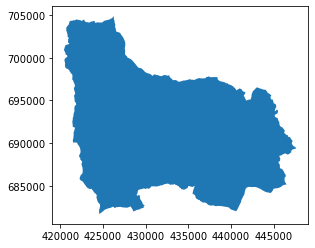

In [ ]:
import osmnx as ox
city = ox.geocode_to_gdf('Medellín, Colombia')
ax = ox.project_gdf(city).plot()

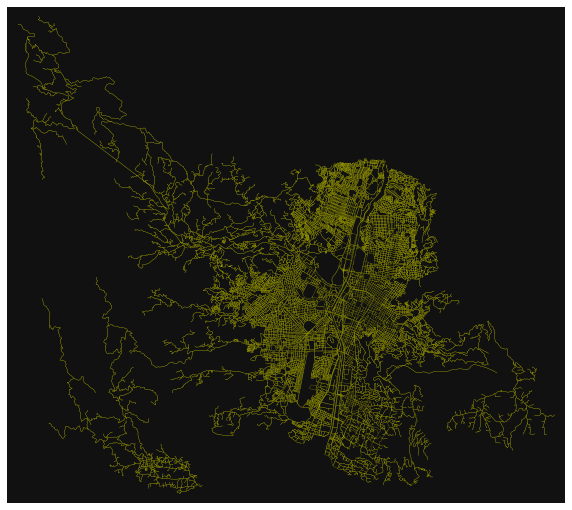

(<Figure size 720x720 with 1 Axes>, <AxesSubplot:>)

In [ ]:
import osmnx as ox
G = ox.graph_from_place('Medellín, Colombia', network_type='drive')
ox.plot_graph(G, figsize=(10, 10), node_size=0, edge_color='y', edge_linewidth=0.2)

Create new dataframe to collect street networks within each voronoi regions

In [ ]:
# get all the parks in some neighborhood
# constrain acceptable `leisure` tag values to `park`
place = 'Medellín, Colombia'
tags = {'leisure': 'park'}
gdf = ox.geometries_from_place(place, tags)
gdf.head()

,unique_id,osmid,element_type,geometry,name,leisure,description,name:en,tourism,wikidata,...,denomination,surface,opening_hours:covid19,access,dog,note,addr:postcode,ways,fixme,type
0,node/3698821056,3698821056,node,POINT (-75.59766 6.21591),Canalización La Mota,park,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,node/3748104496,3748104496,node,POINT (-75.53658 6.29701),parque,park,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,node/3799873281,3799873281,node,POINT (-75.53896 6.29658),NaN,park,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,node/4177117294,4177117294,node,POINT (-75.54455 6.29402),DE PAN,park,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,node/4177131411,4177131411,node,POINT (-75.54495 6.29082),Parque De La Cancha,park,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [23]:
# get everything tagged amenity,
# and everything tagged landuse = retail or commercial,
# and everything tagged highway = bus_stop
tags = {'amenity' : True,
        'landuse' : ['retail', 'commercial'],
        'highway' : 'bus_stop'}
gdf = ox.geometries_from_place('Medellín, Colombia', tags)
gdf.shape

NameError: ignored

In [ ]:
# view just the banks
gdf[gdf['amenity']=='bank'].dropna(axis=1, how='any')

,unique_id,osmid,element_type,amenity,geometry
3,node/338172348,338172348,node,bank,POINT (-75.57888 6.18369)
139,node/1301957616,1301957616,node,bank,POINT (-75.57338 6.24506)
199,node/1656789265,1656789265,node,bank,POINT (-75.57246 6.20187)
201,node/1657087256,1657087256,node,bank,POINT (-75.57177 6.20652)
205,node/1661049493,1661049493,node,bank,POINT (-75.57395 6.19703)
...,...,...,...,...,...
3591,way/576893946,576893946,way,bank,"POLYGON ((-75.56390 6.25020, -75.56381 6.25037..."
3602,way/578911169,578911169,way,bank,"POLYGON ((-75.57308 6.24206, -75.57301 6.24223..."
3603,way/579013177,579013177,way,bank,"POLYGON ((-75.57333 6.24935, -75.57329 6.24945..."
3617,way/579440533,579440533,way,bank,"POLYGON ((-75.55390 6.30649, -75.55385 6.30648..."


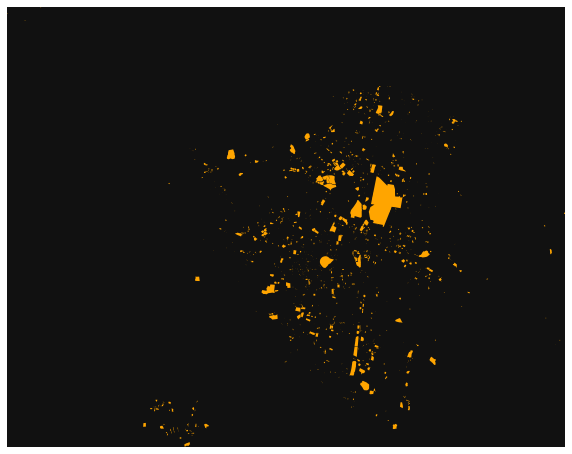

In [ ]:
fig, ax = ox.plot_footprints(gdf, figsize=(10, 10))

### Contextily
Many single datasets lack context when displayed on their own. A common approach to alleviate this is to use web tiles, which are a way of quickly obtaining geographical context to present spatial data. In Python, we can use [`contextily`](https://contextily.readthedocs.io) to pull down tiles and display them along with our own geographic data.

We can begin by creating a map in the same way we would do normally, and then use the `add_basemap` command to, er, add a basemap:

In [25]:
cities = gpd.read_file(gpd.datasets.get_path('naturalearth_cities'))

<Axes: >

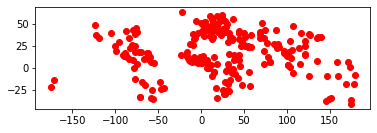

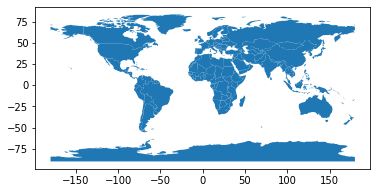

In [29]:
cities.plot(c="red")
gdf.plot()


In [32]:
!pip install contextily

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.1/20.1 MB 27.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.4/55.4 KB 6.3 MB/s eta 0:00:00


In [33]:
import contextily as cx

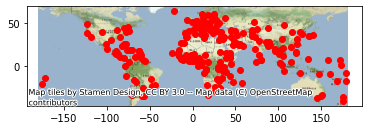

In [34]:
ax = cities.plot(color="red")
cx.add_basemap(ax, crs=cities.crs);

<Axes: >

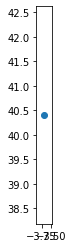

In [42]:
zgz=cities[cities["name"]=="Madrid"]
zgz.plot()

In [37]:
cities["name"]=="Zaragosa"

0      False
1      False
2      False
3      False
4      False
       ...  
238    False
239    False
240    False
241    False
242    False
Name: name, Length: 243, dtype: bool

Note that we need to be explicit when adding the basemap to state the coordinate reference system (`crs`) our data is expressed in, `contextily` will not be able to pick it up otherwise. Conversely, we could change our data's CRS into [Pseudo-Mercator](http://epsg.io/3857), the native reference system for most web tiles:

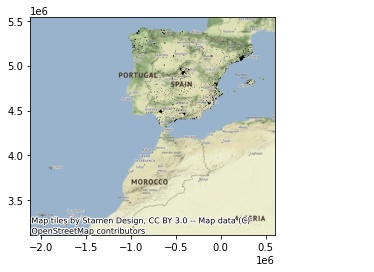

In [ ]:
cities_wm = cities.to_crs(epsg=3857)
ax = cities_wm.plot(color="black")
cx.add_basemap(ax);

Note how the coordinates are different but, if we set it right, either approach aligns tiles and data nicely.

Web tiles can be integrated with other features of maps in a similar way as we have seen above. So, for example, we can change the size of the map, and remove the axis. Let's use Zaragoza for this example:

In [44]:
import matplotlib.pyplot as plt

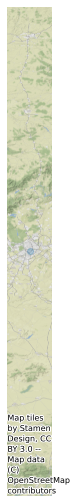

In [45]:
f, ax = plt.subplots(1, figsize=(9, 9))
zgz.plot(alpha=0.25, ax=ax)
cx.add_basemap(ax, crs=zgz.crs)
ax.set_axis_off()

Now, `contextily` offers a lot of options in terms of the sources and providers you can use to create your basemaps. For example, we can use satellite imagery instead:

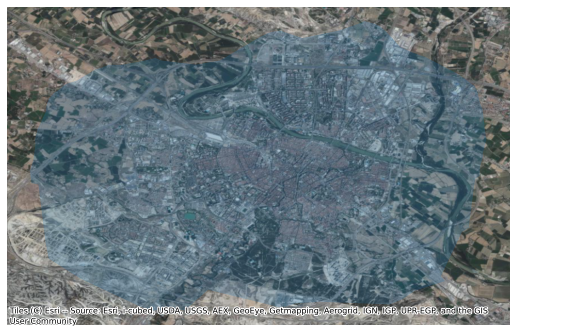

In [ ]:
f, ax = plt.subplots(1, figsize=(9, 9))
zgz.plot(alpha=0.25, ax=ax)
cx.add_basemap(ax, 
               crs=zgz.crs,
               source=cx.providers.Esri.WorldImagery
              )
ax.set_axis_off()

And consider checking out the documentation website for the package:

> [https://contextily.readthedocs.io/en/latest/](https://contextily.readthedocs.io/en/latest/)

## Geoviews

[GeoViews](https://geoviews.org/) is a Python library that makes it easy to explore and visualize geographical, meteorological, and oceanographic datasets, such as those used in weather, climate, and remote sensing research.

In [ ]:
#Para installar en Google Colab
!apt-get install libgeos++ libproj-dev
!pip install geoviews

E: Could not open lock file /var/lib/dpkg/lock-frontend - open (13: Permission denied)
E: Unable to acquire the dpkg frontend lock (/var/lib/dpkg/lock-frontend), are you root?
     |████████████████████████████████| 502 kB 1.0 MB/s eta 0:00:01
     |████████████████████████████████| 10.6 MB 7.3 MB/s eta 0:00:01
     |████████████████████████████████| 12.1 MB 7.1 MB/s eta 0:00:01    |███▌                            | 1.3 MB 8.7 MB/s eta 0:00:02
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 4.3 MB 10.6 MB/s eta 0:00:01
     |████████████████████████████████| 9.0 MB 7.9 MB/s eta 0:00:01
     |████████████████████████████████| 219 kB 8.5 MB/s eta 0:00:01
     |████████████████████████████████| 240 kB 9.1 MB/s eta 0:00:01
     |████████████████████████████████| 97 kB 4.1 MB/s eta 0:00:011
  Created wheel for bokeh: filename=bokeh-2.3.1-py3-none-any.whl size=11299678 sha256

/opt/conda/lib/python3.8/site-packages/param/parameterized.py:998: DeprecationWarning: invalid escape sequence \.
  """
/opt/conda/lib/python3.8/site-packages/holoviews/operation/datashader.py:5: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3, and in 3.9 it will stop working
  from collections import Callable
/opt/conda/lib/python3.8/site-packages/numba/core/ir.py:29: DeprecationWarning: invalid escape sequence \s
  _defmatcher = re.compile('def\s+(\w+)\(.*')
/opt/conda/lib/python3.8/site-packages/numba/core/ir.py:1573: DeprecationWarning: invalid escape sequence \l
  ['  {}\l'.format(x) for x in label.splitlines()],
/opt/conda/lib/python3.8/site-packages/numba/core/ir.py:1575: DeprecationWarning: invalid escape sequence \l
  label = "block {}\l".format(k) + label
/opt/conda/lib/python3.8/site-packages/numba/core/ir.py:1578: DeprecationWarning: invalid escape sequence \l
  label = "{}\l".format(k)
/opt

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
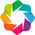

In [ ]:
import geoviews as gv
import geoviews.feature as gf
from geoviews import opts
from cartopy import crs 
import geoviews.tile_sources as gts
from geoviews import opts
from geoviews import opts, tile_sources as gvts
from geoviews import dim, opts
gv.extension('bokeh', 'matplotlib')

In [ ]:
gts.tile_sources

{'CartoDark': :WMTS   [Longitude,Latitude],
 'CartoEco': :WMTS   [Longitude,Latitude],
 'CartoLight': :WMTS   [Longitude,Latitude],
 'CartoMidnight': :WMTS   [Longitude,Latitude],
 'StamenTerrain': :WMTS   [Longitude,Latitude],
 'StamenTerrainRetina': :WMTS   [Longitude,Latitude],
 'StamenWatercolor': :WMTS   [Longitude,Latitude],
 'StamenToner': :WMTS   [Longitude,Latitude],
 'StamenTonerBackground': :WMTS   [Longitude,Latitude],
 'StamenLabels': :WMTS   [Longitude,Latitude],
 'EsriImagery': :WMTS   [Longitude,Latitude],
 'EsriNatGeo': :WMTS   [Longitude,Latitude],
 'EsriUSATopo': :WMTS   [Longitude,Latitude],
 'EsriTerrain': :WMTS   [Longitude,Latitude],
 'EsriReference': :WMTS   [Longitude,Latitude],
 'EsriOceanBase': :WMTS   [Longitude,Latitude],
 'EsriOceanReference': :WMTS   [Longitude,Latitude],
 'OSM': :WMTS   [Longitude,Latitude],
 'Wikipedia': :WMTS   [Longitude,Latitude]}

In [ ]:
stockholm = ( 18.070625,59.320462, 'Stockholm')
london = ( -0.135593, 51.507020, 'London')
istanbul = ( 28.981856, 41.008327, 'Istanbul')
mogadishu = ( 45.299626, 2.042388, 'Mogadishu')

In [ ]:
cities = gv.Points([stockholm, london, istanbul, mogadishu], vdims='City')
cities.dframe()

,x,y,City
0,18.070625,59.320462,Stockholm
1,-0.135593,51.507020,London
2,28.981856,41.008327,Istanbul
3,45.299626,2.042388,Mogadishu


In [ ]:
cities.opts(opts.Points(global_extent=True, width=500, height=475, size=12, color='black'))

:Points   [x,y]   (City)

In [ ]:
gv.Layout([ts.relabel(name) for name, ts in gts.tile_sources.items()]).opts('WMTS', xaxis=None, yaxis=None, width=225, height=225).cols(6)

:Layout
   .WMTS.CartoDark             :WMTS   [Longitude,Latitude]
   .WMTS.CartoEco              :WMTS   [Longitude,Latitude]
   .WMTS.CartoLight            :WMTS   [Longitude,Latitude]
   .WMTS.CartoMidnight         :WMTS   [Longitude,Latitude]
   .WMTS.StamenTerrain         :WMTS   [Longitude,Latitude]
   .WMTS.StamenTerrainRetina   :WMTS   [Longitude,Latitude]
   .WMTS.StamenWatercolor      :WMTS   [Longitude,Latitude]
   .WMTS.StamenToner           :WMTS   [Longitude,Latitude]
   .WMTS.StamenTonerBackground :WMTS   [Longitude,Latitude]
   .WMTS.StamenLabels          :WMTS   [Longitude,Latitude]
   .WMTS.EsriImagery           :WMTS   [Longitude,Latitude]
   .WMTS.EsriNatGeo            :WMTS   [Longitude,Latitude]
   .WMTS.EsriUSATopo           :WMTS   [Longitude,Latitude]
   .WMTS.EsriTerrain           :WMTS   [Longitude,Latitude]
   .WMTS.EsriReference         :WMTS   [Longitude,Latitude]
   .WMTS.EsriOceanBase         :WMTS   [Longitude,Latitude]
   .WMTS.EsriOceanReference    :WMTS   [Longitude,Latitude]
   .WMTS.OSM                   :WMTS   [Longitude,Latitude]
   .WMTS.Wikipedia             :WMTS   [Longitude,Latitude]

In [ ]:
gv.tile_sources.OSM.opts( width=800, height=600)

:WMTS   [Longitude,Latitude]

In [ ]:
(gv.tile_sources.CartoDark * cities).opts(opts.Points(global_extent=True, width=800, height=600, size=8, color='red'))

:Overlay
   .WMTS.I   :WMTS   [Longitude,Latitude]
   .Points.I :Points   [x,y]   (City)

<ipython-input-43-cb1643e7ce00>:6: UserWarning: The default value for the *approx* keyword argument to OSGB will change from True to False after 0.18.
  proj_layout = gv.Layout([gf.coastline.relabel(group=p.__name__).opts(projection=p(), backend='matplotlib')
<ipython-input-43-cb1643e7ce00>:6: UserWarning: The default value for the *approx* keyword argument to OSNI will change from True to False after 0.18.
  proj_layout = gv.Layout([gf.coastline.relabel(group=p.__name__).opts(projection=p(), backend='matplotlib')
/opt/conda/lib/python3.8/site-packages/cartopy/io/__init__.py:241: DownloadWarning: Downloading: https://naciscdn.org/naturalearth/110m/physical/ne_110m_coastline.zip
  warnings.warn('Downloading: {}'.format(url), DownloadWarning)


:Layout
   .RotatedPole.I                :Feature   [Longitude,Latitude]
   .LambertCylindrical.I         :Feature   [Longitude,Latitude]
   .Geostationary.I              :Feature   [Longitude,Latitude]
   .AzimuthalEquidistant.I       :Feature   [Longitude,Latitude]
   .OSGB.I                       :Feature   [Longitude,Latitude]
   .EuroPP.I                     :Feature   [Longitude,Latitude]
   .Gnomonic.I                   :Feature   [Longitude,Latitude]
   .Mollweide.I                  :Feature   [Longitude,Latitude]
   .OSNI.I                       :Feature   [Longitude,Latitude]
   .Miller.I                     :Feature   [Longitude,Latitude]
   .InterruptedGoodeHomolosine.I :Feature   [Longitude,Latitude]
   .SouthPolarStereo.I           :Feature   [Longitude,Latitude]
   .Orthographic.I               :Feature   [Longitude,Latitude]
   .NorthPolarStereo.I           :Feature   [Longitude,Latitude]
   .Robinson.I                   :Feature   [Longitude,Latitude]
   .LambertConformal.I           :Feature   [Longitude,Latitude]
   .AlbersEqualArea.I            :Feature   [Longitude,Latitude]
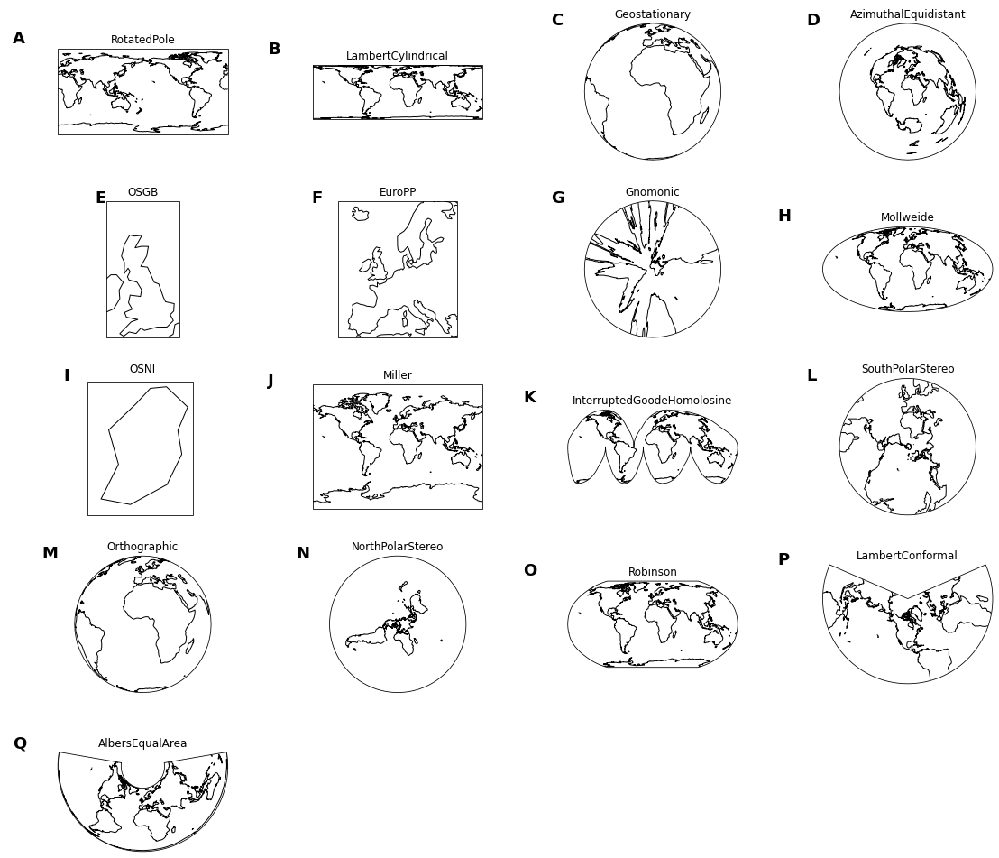

In [ ]:
projections = [crs.RotatedPole, crs.LambertCylindrical, crs.Geostationary, 
 crs.AzimuthalEquidistant, crs.OSGB, crs.EuroPP, crs.Gnomonic,
 crs.Mollweide, crs.OSNI, crs.Miller, crs.InterruptedGoodeHomolosine,
 crs.SouthPolarStereo, crs.Orthographic, crs.NorthPolarStereo, crs.Robinson,
 crs.LambertConformal, crs.AlbersEqualArea]
proj_layout = gv.Layout([gf.coastline.relabel(group=p.__name__).opts(projection=p(), backend='matplotlib')
 for p in projections])
gv.output(proj_layout, backend='matplotlib')

In [ ]:
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

In [ ]:
world_poly = gv.Polygons(world).opts(color='gray', line_color='white' )

In [ ]:
(world_poly * gf.ocean * cities).opts(projection=crs.Orthographic(central_longitude=0.1, central_latitude=22), global_extent=True, width=600, tools=['hover'])

/opt/conda/lib/python3.8/site-packages/cartopy/io/__init__.py:241: DownloadWarning: Downloading: https://naciscdn.org/naturalearth/110m/physical/ne_110m_ocean.zip
  warnings.warn('Downloading: {}'.format(url), DownloadWarning)


:Overlay
   .Polygons.I :Polygons   [Longitude,Latitude]   (pop_est,continent,name,iso_a3,gdp_md_est)
   .Ocean.I    :Feature   [Longitude,Latitude]
   .Points.I   :Points   [x,y]   (City)

In [ ]:
gv.Polygons(world, vdims=['name', 'pop_est', 'gdp_md_est'], label='World Population').opts(color='pop_est',cmap='blues', colorbar=True)

:Polygons   [Longitude,Latitude]   (name,pop_est,gdp_md_est)

In [ ]:
coountries_grouped = gv.Polygons(world, vdims=['name', 'continent'],label='Continent').groupby('continent')

In [ ]:
continents = coountries_grouped.opts(width=600, height=400, tools=['hover'], infer_projection=True)
continents

:HoloMap   [continent]
   :Polygons   [Longitude,Latitude]   (name,continent)

In [ ]:
airports= pd.read_csv('data/airports.csv')
airports.head(5)

,IATA,city,latitude,longitude,passengers,country,color
0,ATH,Athens,37.9354,23.9437,24.13,GR,#30a2da
1,HER,Heraklion,35.3400,25.1753,8.00,GR,#30a2da
2,SKG,Thessaloniki,40.5230,22.9767,6.67,GR,#30a2da
3,RHO,Rhodes,36.4041,28.0898,5.57,GR,#30a2da
4,CFU,Corfu,39.6067,19.9133,3.36,GR,#30a2da


In [ ]:
airports_gv_points = gv.Points(airports, ['longitude', 'latitude'], ['IATA', 'city', 'passengers', 'country', 'color'])

In [ ]:
import numpy as np
(gvts.CartoLight * airports_gv_points).opts(opts.Points(width=1200, height=700, alpha=0.3,
                color=dim('color'), hover_line_color='black',  
                line_color='black', xaxis=None, yaxis=None,
                tools=['hover'],size=np.sqrt(dim('passengers'))*10))

:Overlay
   .WMTS.I   :WMTS   [Longitude,Latitude]
   .Points.I :Points   [longitude,latitude]   (IATA,city,passengers,country,color)

In [ ]:
from bokeh.models import HoverTool
tooltips = [('IATA', '@IATA'),
            ('Passengers', '@passengers{0.00 a}m'),
            ('City', '@city'),
            ('Country', '@country'),
            ('Longitude', '$x'),
            ('Latitude', '$y'),
            ]
hover = HoverTool(tooltips=tooltips)

(gvts.CartoLight * airports_gv_points).opts(
    opts.Points(width=1200, height=700, alpha=0.3,
                color=dim('color'), hover_line_color='black',  
                line_color='black', xaxis=None, yaxis=None,
                tools=[hover],size=np.sqrt(dim('passengers'))*10,
                hover_fill_color=None, hover_fill_alpha=0.5))

:Overlay
   .WMTS.I   :WMTS   [Longitude,Latitude]
   .Points.I :Points   [longitude,latitude]   (IATA,city,passengers,country,color)

In [ ]:
(gvts.CartoLight * airports_gv_points).opts(
    opts.Points(width=1200, height=700, alpha=0.3,
                color=dim('color'), hover_line_color='black',  
                line_color='black', xaxis=None, yaxis=None,
                tools=[hover],size=np.sqrt(dim('passengers'))*10,
                hover_fill_color=None, hover_fill_alpha=0.5))

:Overlay
   .WMTS.I   :WMTS   [Longitude,Latitude]
   .Points.I :Points   [longitude,latitude]   (IATA,city,passengers,country,color)

### Kepler

[Kepler.gl](https://docs.kepler.gl/) is a data-agnostic, high-performance web-based application for visual exploration of large-scale geolocation data sets. Built on top of Mapbox GL and deck.gl, kepler.gl can render millions of points representing thousands of trips and perform spatial aggregations on the fly. 

One of the most prominents examples of interactive maps integrated with notebooks is [Kepler.GL](https://kepler.gl/). Using its Jupyter integration, we can easily convert data (expressed in lon/lat) into interactive maps, and then play further to tweak its appearance. In this context, we will only show how you can take a `GeoDataFrame` into an interactive map in two lines of code:

In [54]:
!pip install Keplergl

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.7/9.7 MB 74.4 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Using cached jedi-0.18.2-py2.py3-none-any.whl (1.6 MB)
  Created wheel for Keplergl: filename=keplergl-0.3.2-py2.py3-none-any.whl size=17922343 sha256=5b8f2c5f341b9dce7cc7196ac9e8998f4fb31fa9201bfaad29d3021a85001cb5
  Stored in directory: /root/.cache/pip/wheels/15/7f/48/aa4980536f7c9fbc783b2a191a579e73e7f74c41afc3f33c61
Successfully built Keplergl


In [53]:
from keplergl import KeplerGL

ModuleNotFoundError: ignored

In [51]:
# NOTE: this may not render on the website

# Create a new map
m = KeplerGl()
# Append your data in lon/lat
m.add_data(streets, name="Streets")
# Display
m

NameError: ignored

In [ ]:
from keplergl import KeplerGl

In [ ]:
#Create a basemap 
map = KeplerGl(height=600, width=800)
#show the map
map

User Guide: https://docs.kepler.gl/docs/keplergl-jupyter


KeplerGl(height=600)

In [ ]:
# Add data to Kepler
map.add_data(data=cities, name='name')

## Gmplot

[gmplot](https://github.com/gmplot/gmplot) is a matplotlib-like interface to generate the HTML and javascript to render all the data user would like on top of Google Maps.

In [ ]:
!pip install gmplot

     |████████████████████████████████| 164 kB 1.1 MB/s eta 0:00:01


In [ ]:
import gmplot 
with open("data/google_token.txt","r") as f: apikey = f.read();

In [ ]:
latitudes = airports["latitude"]
longitudes = airports["longitude"]
gmap = gmplot.GoogleMapPlotter(35, 139, 5, apikey=apikey)
gmap.scatter(latitudes, longitudes, color= 'red', size = 5)
gmap.draw('gmap.html')

In [ ]:
latitude_list = [ 17.4567417, 17.5587901, 17.6245545]
longitude_list = [ 78.2913637, 78.007699, 77.9266135 ]
gmap = gmplot.GoogleMapPlotter(17.438139, 78.3936413, 11)
gmap.scatter( latitude_list, longitude_list, size = 40, marker = False)
gmap.polygon(latitude_list, longitude_list, color = 'cornflowerblue')
gmap.draw('poligono.html')

In [ ]:
gmap2 = gmplot.GoogleMapPlotter.from_geocode( "Medellín, Colombia", apikey=apikey ) 
gmap2.draw( "map.html" ) 

## Bokeh

[Bokeh](https://bokeh.org/) is an interactive visualization library for modern web browsers. It provides elegant, concise construction of versatile graphics, and affords high-performance interactivity over large or streaming datasets. Bokeh can help anyone who would like to quickly and easily make interactive plots, dashboards, and data applications. It is good for:

* Interactive visualization in modern browsers
* Standalone HTML documents, or server-backed apps
* Expressive and versatile graphics
* Large, dynamic or streaming data
* Easy usage from python (or Scala, or R, or...)

In [ ]:
from bokeh.io import output_file, output_notebook, show
from bokeh.models import ColumnDataSource, GMapOptions
from bokeh.plotting import figure, gmap

In [ ]:
output_notebook()

Loading BokehJS ...

If everything is working, you should see a Bokeh logo and a message like "BokehJS 1.4.0 successfully loaded." as the output.

The basic outline is:
* create a blank figure: `p = figure(...)`
* call a glyph method such as `p.circle` on the figure
* `show` the figure

In [ ]:
# create a new plot with default tools, using figure
p = figure(plot_width=400, plot_height=400)

# add a circle renderer with x and y coordinates, size, color, and alpha
p.circle([1, 2, 3, 4, 5], [6, 7, 2, 4, 5], size=15, line_color="navy", fill_color="orange", fill_alpha=0.5)

show(p) # show the results

There are many marker types available in Bokeh, you can see details and
example plots for all of them in the reference guide by clicking on entries in the list below:

* [asterisk()](https://bokeh.pydata.org/en/latest/docs/reference/plotting.html#bokeh.plotting.figure.Figure.asterisk)
* [circle()](https://bokeh.pydata.org/en/latest/docs/reference/plotting.html#bokeh.plotting.figure.Figure.circle)
* [circle_cross()](https://bokeh.pydata.org/en/latest/docs/reference/plotting.html#bokeh.plotting.figure.Figure.circle_cross)
* [circle_x()](https://bokeh.pydata.org/en/latest/docs/reference/plotting.html#bokeh.plotting.figure.Figure.circle_x)
* [cross()](https://bokeh.pydata.org/en/latest/docs/reference/plotting.html#bokeh.plotting.figure.Figure.cross)
* [diamond()](https://bokeh.pydata.org/en/latest/docs/reference/plotting.html#bokeh.plotting.figure.Figure.diamond)
* [diamond_cross()](https://bokeh.pydata.org/en/latest/docs/reference/plotting.html#bokeh.plotting.figure.Figure.diamond_cross)
* [hex()](https://bokeh.pydata.org/en/latest/docs/reference/plotting.html#bokeh.plotting.figure.Figure.hex)
* [inverted_triangle()](https://bokeh.pydata.org/en/latest/docs/reference/plotting.html#bokeh.plotting.figure.Figure.inverted_triangle)
* [square()](https://bokeh.pydata.org/en/latest/docs/reference/plotting.html#bokeh.plotting.figure.Figure.square)
* [square_cross()](https://bokeh.pydata.org/en/latest/docs/reference/plotting.html#bokeh.plotting.figure.Figure.square_cross)
* [square_x()](https://bokeh.pydata.org/en/latest/docs/reference/plotting.html#bokeh.plotting.figure.Figure.square_x)
* [triangle()](https://bokeh.pydata.org/en/latest/docs/reference/plotting.html#bokeh.plotting.figure.Figure.triangle)
* [x()](https://bokeh.pydata.org/en/latest/docs/reference/plotting.html#bokeh.plotting.figure.Figure.x)

In [ ]:
# create a new plot (with a title) using figure
p = figure(plot_width=400, plot_height=400, title="My Line Plot")

# add a line renderer
p.line([1, 2, 3, 4, 5], [6, 7, 2, 4, 5], line_width=2)

show(p) # show the results

You can plot geographic data just like any other type of data, as in the [Texas Unemployment example](https://docs.bokeh.org/en/latest/docs/gallery/texas.html), but Bokeh also Bokeh provides several specialized mechanisms for plotting data in geographic coordinates:

* [GMapPlot](https://docs.bokeh.org/en/latest/docs/user_guide/geo.html#google-maps-support): Bokeh Plots on top of Google Maps

* [TileSource](https://docs.bokeh.org/en/latest/docs/user_guide/geo.html#tile-providers), especially WMTSTileSource: allows data to be overlaid on data from any map tile server, including 
[Google Maps](http://maps.google.com), 
[Stamen](http://maps.stamen.com), 
[MapQuest](https://www.mapquest.com/), 
[OpenStreetMap](https://www.openstreetmap.org), 
[ESRI](http://www.esri.com), 
and custom servers.

* [GeoJSONDataSource](https://docs.bokeh.org/en/latest/docs/user_guide/geo.html#geojson-datasource): Allows reading data in [GeoJSON](http://geojson.org/) format for use with Bokeh plots and glyphs, similar to `ColumnDataSource`.

In [ ]:
import os
from bokeh.models import GMapOptions
from bokeh.plotting import gmap

map_options = GMapOptions(lat=6.25, lng=-75.6, map_type="roadmap", zoom=9)

p = gmap(apikey, map_options, title="Valle de Aburrá")

data = dict(lat=[ 6.22,  6.23,  6.24],
            lon=[-75.4, -75.3, -75.5])

p.circle(x="lon", y="lat", size=15, fill_color="blue", fill_alpha=0.8, source=data)

show(p)

## Basemap

[Basemap](https://basemaptutorial.readthedocs.io/en/latest/) is a great tool for creating maps using python in a simple way. It’s a matplotlib extension, so it has got all its features to create data visualizations, and adds the geographical projections and some datasets to be able to plot coast lines, countries, and so on directly from the library.

Se recomienda utilizar Google colab e instalarlo con el siguiente codigo

In [ ]:
!pip install https://github.com/matplotlib/basemap/archive/v1.2.2rel.zip

In [ ]:
from mpl_toolkits.basemap import Basemap

ModuleNotFoundError: No module named 'mpl_toolkits.basemap'

In [ ]:
x1 = -85.
x2 = -65.
y1 = -10.
y2 = 21.

In [ ]:
m = Basemap(resolution='l',projection='merc',\
            llcrnrlat=y1,urcrnrlat=y2,llcrnrlon=x1,\
            urcrnrlon=x2,lat_ts=(x1+x2)/2)

In [ ]:
lat = 6.2
lon = -75.8
x,y = m(lon,lat)

In [ ]:
plt.figure(figsize=(8,7))
m.drawcoastlines(linewidth=1)
m.drawcountries(linewidth=1)
m.fillcontinents(color='lightgray',lake_color='aqua',alpha=0.5)
m.drawmeridians(np.arange(0,360,10),labels=[False,True,True,False])
m.drawparallels(np.arange(-10,20.1,10),labels=[False,True,True,False])
m.drawmapscale(-70,-8,-75,5,200,barstyle='fancy');
m.shadedrelief()
m.drawrivers(linewidth=0.2,color='blue')
m.scatter(x,y,300,zorder=10)
plt.text(x+20000,y+20000,"Valle de Aburrá",color='black',size=14);

In [ ]:
map = Basemap(projection='ortho', 
              lat_0=0, lon_0=0)

map.drawmapboundary(fill_color='aqua')
map.fillcontinents(color='coral',lake_color='aqua')
map.drawcoastlines()

lons = [0, 10, -20, -20]
lats = [0, -10, 40, -20]

x, y = map(lons, lats)

map.scatter(x, y, marker='D',color='m')

plt.show()

## Plotly

The [plotly Python library](https://plotly.com/python/) is an interactive, open-source plotting library that supports over 40 unique chart types covering a wide range of statistical, financial, geographic, scientific, and 3-dimensional use-cases.

Built on top of the Plotly JavaScript library (plotly.js), plotly enables Python users to create beautiful interactive web-based visualizations that can be displayed in Jupyter notebooks, saved to standalone HTML files, or served as part of pure Python-built web applications using Dash. The plotly Python library is sometimes referred to as "plotly.py" to differentiate it from the JavaScript library.

In [ ]:
!pip install plotly

In [ ]:
!pip install jupyterlab ipywidgets

In [ ]:
!jupyter labextension install jupyterlab-plotly

Building jupyterlab assets (build:prod:minimize)


In [ ]:
import plotly.graph_objects as go
fig = go.Figure(data=go.Bar(y=[2, 3, 1]))
fig.write_html('first_figure.html', auto_open=True)

In [ ]:
import plotly.express as px
map = px.scatter_geo(airports, lat=airports["latitude"], lon=airports["longitude"], hover_name="city")
map.show()

In [ ]:
import plotly.graph_objects as go

df = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/2015_06_30_precipitation.csv')

scl = [0,"rgb(150,0,90)"],[0.125,"rgb(0, 0, 200)"],[0.25,"rgb(0, 25, 255)"],[0.375,"rgb(0, 152, 255)"],
[0.5,"rgb(44, 255, 150)"],[0.625,"rgb(151, 255, 0)"],[0.75,"rgb(255, 234, 0)"],[0.875,"rgb(255, 111, 0)"],[1,"rgb(255, 0, 0)"]

fig = go.Figure(data=go.Scattergeo(
    lat = df['Lat'],
    lon = df['Lon'],
    text = df['Globvalue'].astype(str) + ' inches',
    marker = dict(
        color = df['Globvalue'],
        colorscale = scl,
        reversescale = True,
        opacity = 0.7,
        size = 2,
        colorbar = dict(
            titleside = "right",
            outlinecolor = "rgba(68, 68, 68, 0)",
            ticks = "outside",
            showticksuffix = "last",
            dtick = 0.1
        )
    )
))

fig.update_layout(
    geo = dict(
        scope = 'north america',
        showland = True,
        landcolor = "rgb(212, 212, 212)",
        subunitcolor = "rgb(255, 255, 255)",
        countrycolor = "rgb(255, 255, 255)",
        showlakes = True,
        lakecolor = "rgb(255, 255, 255)",
        showsubunits = True,
        showcountries = True,
        resolution = 50,
        projection = dict(
            type = 'conic conformal',
            rotation_lon = -100
        ),
        lonaxis = dict(
            showgrid = True,
            gridwidth = 0.5,
            range= [ -140.0, -55.0 ],
            dtick = 5
        ),
        lataxis = dict (
            showgrid = True,
            gridwidth = 0.5,
            range= [ 20.0, 60.0 ],
            dtick = 5
        )
    ),
    title='US Precipitation 06-30-2015<br>Source: <a href="http://water.weather.gov/precip/">NOAA</a>',
)
fig.show()

In [ ]:
us_cities = pd.read_csv("https://raw.githubusercontent.com/plotly/datasets/master/us-cities-top-1k.csv")
fig = px.scatter_mapbox(us_cities, lat="lat", lon="lon", hover_name="City", hover_data=["State", "Population"],
                        color_discrete_sequence=["fuchsia"], zoom=3, height=600)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [ ]:
fig = px.scatter_mapbox(us_cities, lat="lat", lon="lon", hover_name="City", hover_data=["State", "Population"],
                        color_discrete_sequence=["fuchsia"], zoom=3, height=700)
fig.update_layout(
    mapbox_style="white-bg",
    mapbox_layers=[
        {
            "below": 'traces',
            "sourcetype": "raster",
            "sourceattribution": "United States Geological Survey",
            "source": [
                "https://basemap.nationalmap.gov/arcgis/rest/services/USGSImageryOnly/MapServer/tile/{z}/{y}/{x}"
            ]
        }
      ])
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [ ]:
fig = px.scatter_mapbox(us_cities, lat="lat", lon="lon", hover_name="City", hover_data=["State", "Population"],
                        color_discrete_sequence=["fuchsia"], zoom=3, height=700)
fig.update_layout(
    mapbox_style="white-bg",
    mapbox_layers=[
        {
            "below": 'traces',
            "sourcetype": "raster",
            "sourceattribution": "United States Geological Survey",
            "source": [
                "https://basemap.nationalmap.gov/arcgis/rest/services/USGSImageryOnly/MapServer/tile/{z}/{y}/{x}"
            ]
        },
        {
            "sourcetype": "raster",
            "sourceattribution": "Government of Canada",
            "source": ["https://geo.weather.gc.ca/geomet/?"
                       "SERVICE=WMS&VERSION=1.3.0&REQUEST=GetMap&BBOX={bbox-epsg-3857}&CRS=EPSG:3857"
                       "&WIDTH=1000&HEIGHT=1000&LAYERS=RADAR_1KM_RDBR&TILED=true&FORMAT=image/png"],
        }
      ])
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [ ]:
px.set_mapbox_access_token(open("data/mapbox_token.txt").read())
fig = px.scatter_mapbox(us_cities, lat="lat", lon="lon", hover_name="City", hover_data=["State", "Population"], color_discrete_sequence=["fuchsia"], zoom=3, height=700)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [ ]:
df = px.data.carshare()
fig = px.scatter_mapbox(df, lat="centroid_lat", lon="centroid_lon",  color="peak_hour", size="car_hours",
                  color_continuous_scale=px.colors.cyclical.IceFire, size_max=15, zoom=10)
fig.show()

In [ ]:
from urllib.request import urlopen
import json
with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    counties = json.load(response)

In [ ]:
data_df = pd.read_csv("G:\My Drive\CATEDRA\ANALISISGEOESPACIAL\DATA\proc_data.csv", index_col=0)

In [ ]:
fig = px.choropleth_mapbox(data_df, locations="fips", color="Median_Household_Income_2018",
                           range_color=[0, 100000],
                           geojson=counties, color_continuous_scale=px.colors.diverging.RdYlBu)
fig.update_layout(coloraxis_colorbar=dict(
    tickvals=[0, 20000, 40000, 60000, 80000, 100000],
    ticktext=["0", "20k", "40k", "60k", "80k", "100k+"]
))
fig.update_layout(mapbox_style="carto-positron",
                  mapbox_zoom=3.9, mapbox_center={"lat": 37.0902, "lon": -95.7129},
                  margin={"r": 0, "t": 0, "l": 0, "b": 0})
fig.update_traces(marker=dict(line=dict(width=0.3, color="gray")))
fig.show()

In [ ]:
# Map showing counties with typical income < 40k
tmp_df = data_df[data_df["Median_Household_Income_2018"] < 40000]
fig = px.choropleth_mapbox(tmp_df, locations="fips", color="Median_Household_Income_2018",
                           range_color=[0, 100000],
                           geojson=counties, color_continuous_scale=px.colors.diverging.RdYlBu)
fig.update_layout(coloraxis_colorbar=dict(
    tickvals=[0, 20000, 40000, 60000, 80000, 100000],
    ticktext=["0", "20k", "40k", "60k", "80k", "100k+"]
))
fig.update_layout(mapbox_style="carto-positron",
                  mapbox_zoom=3.9, mapbox_center={"lat": 37.0902, "lon": -95.7129},
                  margin={"r": 0, "t": 0, "l": 0, "b": 0})
fig.update_traces(marker=dict(line=dict(width=0.3, color="gray")))
fig.show()

In [ ]:
x = pd.qcut(tmp_df["POP_ESTIMATE_2018"], 4)

In [ ]:
bins = [0, 10000, 25000, 65000, np.inf]
names = ['<10k', '10k-25k', '25k-65k', '65k+']
x = pd.cut(tmp_df["POP_ESTIMATE_2018"], bins=bins, labels=names)
tmp_df = data_df.assign(pop_bin=x)

bins = [0, 40000, 50000, 60000, 70000, 80000, np.inf]
names = ['<40k', '40k-50k', '50k-60k', '60k-70k', '70k-80k', '80k+']
x = pd.cut(tmp_df["Median_Household_Income_2018"], bins=bins, labels=names)
tmp_df = tmp_df.assign(income_bin=x)

grp_df = tmp_df.groupby(["income_bin", "pop_bin"]).agg(["mean", "count"])["PCTPOVALL_2018"].reset_index()
fig = px.bar(
    grp_df, x="income_bin", y="mean", barmode="group", title="Differences in Poverty Rates - Large vs Small Counties",
    category_orders={"pov_income": names},
    labels={"income_bin": "Typical Household Income ($)", "mean": "Average poverty rate (%)", "pop_bin": "County population"},
    color="pop_bin",
    color_discrete_sequence=px.colors.sequential.Bluyl,
    template="plotly_white",
)
fig.update_traces(marker=dict(line=dict(width=0.5, color="Silver")))
fig.show()